# Implementation Convolutional Bayesian Denoising Autoencoder Alzheimer MRI Scan Dataset


## Data loading and processing

In [39]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data import random_split, DataLoader
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
!pip install -q tensorflow
%load_ext tensorboard

from skimage.metrics import structural_similarity as ssim

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

random_seed = 43
# Set random seed
torch.manual_seed(random_seed)
np.random.seed(random_seed)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [40]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [41]:
import os
import glob
import numpy as np
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

image_size = 128

class MRIDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir) if fname.endswith('.jpeg') or fname.endswith('.jpg')]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('L')
        image.draft('L', (image_size, image_size))

        if self.transform:
            image = self.transform(image)

        # If you have labels, modify this part to return the corresponding label as well.
        return (image, 0)

# Define the path to your dataset
dataset_path = '/content/drive/MyDrive/mri_dataset'

# Define any transformations (e.g., normalization, resizing)
transform = transforms.Compose([
    # transforms.Resize((image_size, image_size)),  # Resize images to 128x128
    transforms.ToTensor(),  # Convert images to PyTorch tensors
])

# Create an instance of the dataset
xray_dataset = MRIDataset(root_dir=dataset_path, transform=transform)

print(len(xray_dataset))

# Split dataset into train/validation/test sets
train_indices, temp_indices = train_test_split(np.arange(len(xray_dataset)), test_size=0.3, random_state=random_seed)
val_indices, test_indices = train_test_split(temp_indices, test_size=0.5, random_state=random_seed)

# Create data loaders
train_sampler = torch.utils.data.SubsetRandomSampler(train_indices)
val_sampler = torch.utils.data.SubsetRandomSampler(val_indices)
test_sampler = torch.utils.data.SubsetRandomSampler(test_indices)

train_loader = DataLoader(xray_dataset, batch_size=64, sampler=train_sampler)
val_loader = DataLoader(xray_dataset, batch_size=64, sampler=val_sampler)
test_loader = DataLoader(xray_dataset, batch_size=64, sampler=test_sampler)

# Checking dataset sizes
print(f'Training dataset size: {len(train_sampler)}')
print(f'Validation dataset size: {len(val_sampler)}')
print(f'Test dataset size: {len(test_sampler)}')

print(len(train_loader))


6400
Training dataset size: 4480
Validation dataset size: 960
Test dataset size: 960
70


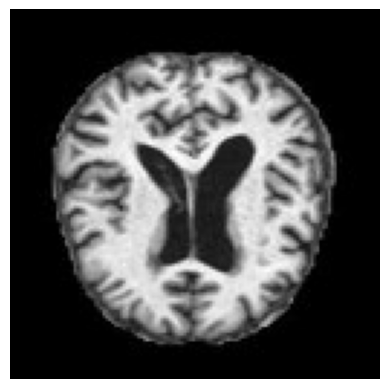

In [42]:
# Get the first batch of data
data_iter = iter(train_loader)
images, _ = next(data_iter)

# Extract the first image from the batch
first_image = images[0]

# Convert tensor to image
first_image = first_image.squeeze().numpy()  # Squeeze removes the single channel dimension
first_image = first_image * 255  # Undo normalization

# Plot the image
plt.imshow(first_image, cmap='gray')
plt.axis('off')
plt.show()

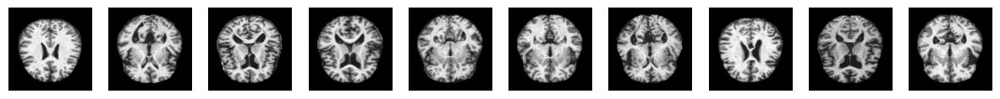

In [43]:
# Get a batch of training data
data_iter = iter(train_loader)
images, _ = next(data_iter)

# Plot the first 10 images
fig, axes = plt.subplots(1, 10, figsize=(15, 1.5))
for i in range(10):
    ax = axes[i]
    ax.imshow(images[i].numpy().squeeze(), cmap='gray')
    ax.axis('off')
    # ax.set_title('Label: {}'.format(labels[i].item()))

plt.show()

## Autoencoder Architectures

In [44]:
dropout_rate = 0.1

def MC_dropout(act_vec, p=0.5, mask=True):
  return F.dropout(act_vec, p=p, training=mask, inplace=False)

class ConvolutionalBDAE(nn.Module):
    def __init__(self):
        super().__init__()

        # Encoder layers
        self.conv1 = nn.Conv2d(1, 64, 3, stride=2, padding=1)  # Increased number of output channels
        self.conv2 = nn.Conv2d(64, 128, 3, stride=2, padding=1)  # Increased number of output channels
        self.conv3 = nn.Conv2d(128, 256, 7)  # Increased number of output channels

        # Decoder layers
        self.deconv1 = nn.ConvTranspose2d(256, 128, 7)  # Increased number of input channels
        self.deconv2 = nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1)  # Increased number of input channels
        self.deconv3 = nn.ConvTranspose2d(64, 1, 3, stride=2, padding=1, output_padding=1)  # Increased number of input channels
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, dropout_p=dropout_rate, apply_dropout=True):
        # Encoder
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))

        # Decoder
        x = F.relu(self.deconv1(x))
        x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = F.relu(self.deconv2(x))
        x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = self.sigmoid(self.deconv3(x))

        return x

    def sample_predict(self, x, Nsamples):
      predictions = x.data.new(Nsamples, x.shape[0], image_size*image_size)
      for i in range(Nsamples):
        y = self.forward(x)
        predictions[i] = y.view(-1, image_size*image_size)

      predictions_mean = torch.mean(predictions, dim=0)
      predictions_var = torch.var(predictions, dim=0)

      predictions_mean = predictions_mean.view(-1, 1, image_size, image_size)
      predictions_var = predictions_var.view(-1, 1, image_size, image_size)

      return predictions, predictions_mean, predictions_var


class ConvolutionalDAE(nn.Module):
    def __init__(self):
        super().__init__()

        # Encoder layers
        self.conv1 = nn.Conv2d(1, 64, 3, stride=2, padding=1)  # Increased number of output channels
        self.conv2 = nn.Conv2d(64, 128, 3, stride=2, padding=1)  # Increased number of output channels
        self.conv3 = nn.Conv2d(128, 256, 7)  # Increased number of output channels

        # Decoder layers
        self.deconv1 = nn.ConvTranspose2d(256, 128, 7)  # Increased number of input channels
        self.deconv2 = nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1)  # Increased number of input channels
        self.deconv3 = nn.ConvTranspose2d(64, 1, 3, stride=2, padding=1, output_padding=1)  # Increased number of input channels
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, dropout_p=0.1, apply_dropout=True):
        # Encoder
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))

        # Decoder
        x = F.relu(self.deconv1(x))
        # x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = F.relu(self.deconv2(x))
        # x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = self.sigmoid(self.deconv3(x))

        return x

    def sample_predict(self, x, Nsamples):
      predictions = x.data.new(Nsamples, x.shape[0], image_size*image_size)
      for i in range(Nsamples):
        y = self.forward(x)
        predictions[i] = y.view(-1, image_size*image_size)

      predictions_mean = torch.mean(predictions, dim=0)
      predictions_var = torch.var(predictions, dim=0)

      predictions_mean = predictions_mean.view(-1, 1, image_size, image_size)
      predictions_var = predictions_var.view(-1, 1, image_size, image_size)

      return predictions, predictions_mean, predictions_var

Linear models

In [45]:
class LinearBDAE(nn.Module):
    def __init__(self):
        super().__init__()
        # Encoder layers
        self.enc_fc1 = nn.Linear(image_size*image_size, 1024)
        self.enc_fc2 = nn.Linear(1024, 512)
        self.enc_fc3 = nn.Linear(512, 256)

        # Decoder layers
        self.dec_fc1 = nn.Linear(256, 512)
        self.dec_fc2 = nn.Linear(512, 1024)
        self.dec_fc3 = nn.Linear(1024, image_size*image_size)

    def forward(self, x, dropout_p=dropout_rate, apply_dropout=True):
        # Encoder forward pass
        x = F.relu(self.enc_fc1(x))
        x = F.relu(self.enc_fc2(x))
        x = F.relu(self.enc_fc3(x))

        # Decoder forward pass with MC Dropout
        x = F.relu(self.dec_fc1(x))
        x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = F.relu(self.dec_fc2(x))
        x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = torch.sigmoid(self.dec_fc3(x))
        return x

    def sample_predict(self, x, Nsamples):
      predictions = x.data.new(Nsamples, x.shape[0], image_size*image_size)
      for i in range(Nsamples):
        y = self.forward(x)
        predictions[i] = y

      predictions_mean = torch.mean(predictions, dim=0)
      predictions_var = torch.var(predictions, dim=0)

      return predictions, predictions_mean, predictions_var


class LinearDAE(nn.Module):
    def __init__(self):
        super().__init__()
        # Encoder layers
        self.enc_fc1 = nn.Linear(image_size*image_size, 1024)
        self.enc_fc2 = nn.Linear(1024, 512)
        self.enc_fc3 = nn.Linear(512, 256)

        # Decoder layers
        self.dec_fc1 = nn.Linear(256, 512)
        self.dec_fc2 = nn.Linear(512, 1024)
        self.dec_fc3 = nn.Linear(1024, image_size*image_size)

    def forward(self, x, dropout_p=dropout_rate, apply_dropout=True):
        # Encoder forward pass
        x = F.relu(self.enc_fc1(x))
        x = F.relu(self.enc_fc2(x))
        x = F.relu(self.enc_fc3(x))

        # Decoder forward pass with MC Dropout
        x = F.relu(self.dec_fc1(x))
        # x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = F.relu(self.dec_fc2(x))
        # x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = torch.sigmoid(self.dec_fc3(x))
        return x

    def sample_predict(self, x, Nsamples):
      predictions = x.data.new(Nsamples, x.shape[0], image_size*image_size)
      for i in range(Nsamples):
        y = self.forward(x)
        predictions[i] = y

      predictions_mean = torch.mean(predictions, dim=0)
      predictions_var = torch.var(predictions, dim=0)

      return predictions, predictions_mean, predictions_var

In [ ]:
from torchsummary import summary
summary(LinearBDAE(), (1, 128*128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1              [-1, 1, 1024]      16,778,240
            Linear-2               [-1, 1, 512]         524,800
            Linear-3               [-1, 1, 256]         131,328
            Linear-4               [-1, 1, 512]         131,584
            Linear-5              [-1, 1, 1024]         525,312
            Linear-6             [-1, 1, 16384]      16,793,600
Total params: 34,884,864
Trainable params: 34,884,864
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.06
Forward/backward pass size (MB): 0.15
Params size (MB): 133.08
Estimated Total Size (MB): 133.29
----------------------------------------------------------------


## Noise schemes

In [48]:
def add_gaussian_noise(images, noise_factor=0.5):
  corrupted_images = images + noise_factor * torch.randn(*images.shape)
  corrupted_images = np.clip(corrupted_images, 0., 1.)
  return corrupted_images

## Training Process

### Training functions

In [46]:
def train(train_loader, net, optimizer, criterion, noise_factor):
  total_loss = 0

  for i, data in enumerate(train_loader):

        images, _ = data
        images = images.view(images.size(0), -1)

        # ADD NOISE PROCESS
        corrupted_images = add_gaussian_noise(images, noise_factor)

        images = images.to(device)
        corrupted_images = corrupted_images.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net.forward(corrupted_images)

        loss = criterion(outputs, images)

        loss.backward()
        optimizer.step()

        # keep track of loss and accuracy
        total_loss += loss.item() * images.size(0)

  avg_loss = total_loss/len(train_loader.dataset)  # Compute average loss

  return avg_loss

In [47]:
def validation(val_loader, net, criterion, Nsamples, noise_factor):
  total_loss = 0

  # Use torch.no_grad to skip gradient calculation, not needed for evaluation
  with torch.no_grad():
      # iterate through batches
        for data in val_loader:
            # get the inputs; data is a list of [inputs, labels]
            images, _ = data
            images = images.view(images.size(0), -1)

            corrupted_images = add_gaussian_noise(images, noise_factor)

            images = images.to(device)
            corrupted_images = corrupted_images.to(device)

            # forward pass
            predictions, predictions_mean, predictions_var = net.sample_predict(corrupted_images, Nsamples)
            # print('predictions_mean:', predictions_mean.shape)
            # outputs = net.forward(corrupted_images)
            loss = criterion(predictions_mean, images) #changed from predictions_mean to outputs

            # keep track of loss and accuracy
            total_loss += loss.item() * images.size(0)

  return total_loss/len(val_loader.dataset)

### Training Procedure

In [49]:
print(random_seed)

43


In [ ]:
# To completely clean your tensorboard uncomment and run the following command.
!rm -r runs
#Set random seed
torch.manual_seed(random_seed)

# Create a writer to write to Tensorboard
writer = SummaryWriter()

model = LinearBDAE().to(device)
noise_factor = 0.3
learning_rate = 0.001
save_path = f'mri_ES_linear_bdae_lr={learning_rate}_seed={random_seed}.pth'

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

max_epochs = 100
patience = 5
best_val_loss = float('inf')
patience_counter = 0

Nsamples = 5

for epoch in tqdm(range(max_epochs)):  # loop over the dataset multiple times
    # Train on data
    train_loss = train(train_loader, model, optimizer, criterion, noise_factor)

    val_loss = validation(val_loader, model, criterion, Nsamples, noise_factor)

    # Log metrics to Tensorboard
    writer.add_scalars("Loss", {'Train': train_loss, 'Validation': val_loss}, epoch)

    # Check for early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        # Save the best model
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss
        }, save_path)
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping triggered after {epoch+1} epochs.")
            break

print('Finished Training')
print(f'Best validation loss = {best_val_loss}')

# Close the writer
writer.flush()
writer.close()

 86%|████████▌ | 86/100 [28:59<04:41, 20.09s/it]

In [ ]:
# To completely clean your tensorboard uncomment and run the following command.
!rm -r runs
#Set random seed
torch.manual_seed(42)

# Create a writer to write to Tensorboard
writer = SummaryWriter()

model_dae_mri = ConvolutionalDAE().to(device)
criterion = nn.MSELoss()
learning_rate = 0.001
optimizer = torch.optim.Adam(model_dae_mri.parameters(), lr=learning_rate)

num_epochs = 25

noise_factor = 0.3

Nsamples = 50

for epoch in tqdm(range(num_epochs)):  # loop over the dataset multiple times
    # Train on data
    train_loss = train(train_loader, model_dae_mri, optimizer, criterion, noise_factor)

    # Test on data
    if epoch == num_epochs-1:
      val_loss = validation(val_loader, model_dae_mri, criterion, Nsamples, noise_factor)

    # # Log metrics to Tensorboard
    # writer.add_scalars("Loss", {'Train': train_loss, 'Validation':val_loss}, epoch)

# Define the path to save the model
save_path = '/content/mri_25_convolutional_dae.pth'

torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss
        }, save_path)

print('Finished Training')
print(f'Train loss = {train_loss}')
print(f'Validation loss = {val_loss}')

#Close the writer
writer.flush()
writer.close()

100%|██████████| 25/25 [09:26<00:00, 22.64s/it]

Finished Training
Train loss = 0.0027734078373759987
Validation loss = 0.0006022183364257217


In [35]:
%tensorboard --logdir runs/

Reusing TensorBoard on port 6006 (pid 19975), started 0:45:13 ago. (Use '!kill 19975' to kill it.)

<IPython.core.display.Javascript object>

## Visualizations

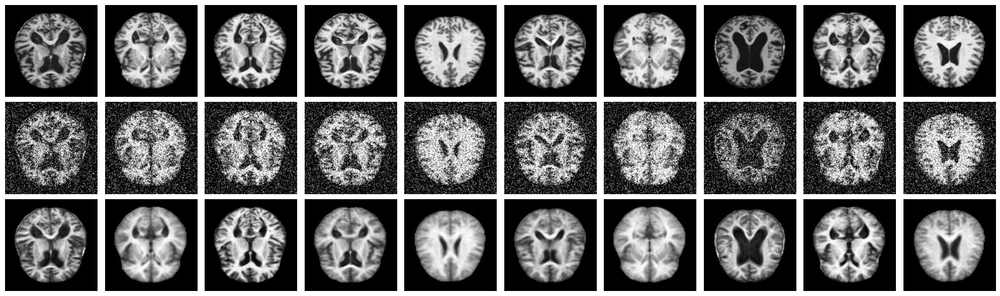

In [37]:
def display_images(train_loader, net):
    # Get the first batch of images
    images, _ = next(iter(train_loader))

    # Add noise to images
    corrupted_images = add_gaussian_noise(images, noise_factor)

    corrupted_images = corrupted_images.to(device).view(-1, 128*128)

    # Pass corrupted images through the network to get denoised images
    net.eval()
    with torch.no_grad():
        denoised_images = net(corrupted_images)

    # Convert images to numpy for visualization
    images_np = images.numpy()
    corrupted_images_np = corrupted_images.view(denoised_images.size(0), 1, image_size, image_size).cpu().numpy()
    denoised_images_np = denoised_images.view(denoised_images.size(0), 1, image_size, image_size).cpu().numpy()

    # Display images
    fig, axes = plt.subplots(nrows=3, ncols=10, figsize=(20, 6))
    for i in range(10):
        # Original images
        ax = axes[0, i]
        ax.imshow(images_np[i].transpose(1, 2, 0), cmap='gray')
        ax.axis('off')

        # Corrupted images
        ax = axes[1, i]
        ax.imshow(corrupted_images_np[i].transpose(1, 2, 0), cmap='gray')
        ax.axis('off')

        # Denoised images
        ax = axes[2, i]
        ax.imshow(denoised_images_np[i].transpose(1, 2, 0), cmap='gray')
        ax.axis('off')

    axes[0, 0].set_ylabel('Original', size='large')
    axes[1, 0].set_ylabel('Corrupted', size='large')
    axes[2, 0].set_ylabel('Denoised', size='large')

    plt.tight_layout()
    plt.show()

display_images(train_loader, model)

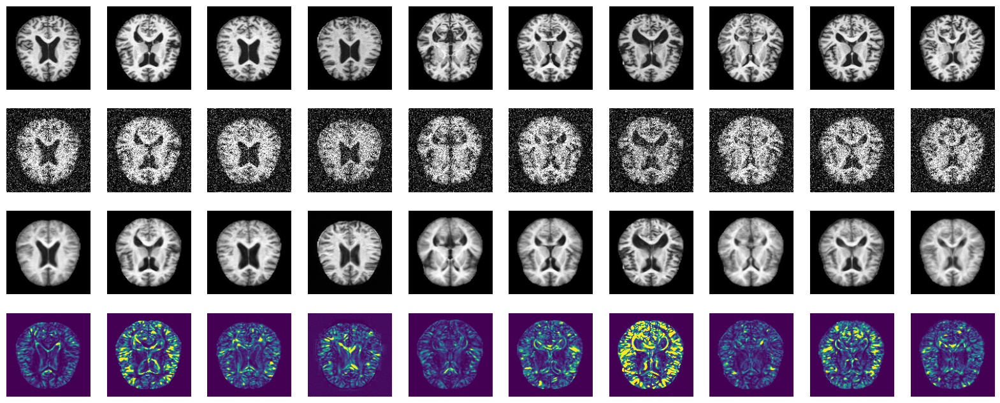

In [38]:
def plot_mean_variance(train_loader):
  images, _ = next(iter(train_loader))
  # Add noise to images
  corrupted_images = add_gaussian_noise(images, noise_factor)

  corrupted_images = corrupted_images.to(device).view(-1, 128*128)

  model.eval()
  with torch.no_grad():
      _, predictions_mean, predictions_var = model.sample_predict(corrupted_images, Nsamples)


  # Assuming predictions_mean and predictions_var are tensors
  first_ten_mean = predictions_mean[:10]  # Extracting the first ten samples from predictions_mean
  first_ten_var = predictions_var[:10]    # Extracting the first ten samples from predictions_var

  # Reshaping the samples back into images
  first_ten_mean_images = first_ten_mean.view(-1, image_size, image_size)  # Assuming images are 28x28
  first_ten_var_images = first_ten_var.view(-1, image_size, image_size)    # Assuming images are 28x28

  # Assuming images are 28x28

  # Extracting the first ten samples from the batch
  clean_images = images[:10]
  corrupted_images_subset = corrupted_images.cpu()[:10]
  mean_images = first_ten_mean_images.cpu()
  var_images = first_ten_var_images.cpu()

  # Plotting the images
  fig, axs = plt.subplots(4, 10, figsize=(20, 8))

  for i in range(10):
      # Plot clean images
      im_clean = axs[0, i].imshow(clean_images[i].view(image_size, image_size), cmap='gray')
      axs[0, i].axis('off')

      # Plot corrupted images
      im_corrupted = axs[1, i].imshow(corrupted_images_subset[i].view(image_size, image_size), cmap='gray')
      axs[1, i].axis('off')

      # Plot denoised (mean) images
      im_mean = axs[2, i].imshow(mean_images[i], cmap='gray')
      axs[2, i].axis('off')

      # Plot uncertainty (variance) images
      im_var = axs[3, i].imshow(var_images[i], cmap='viridis', vmax=0.004)
      axs[3, i].axis('off')


  # Add colorbars for the uncertainty (variance) images
  # fig.colorbar(im_var, ax=axs[3, :], shrink=0.6)

  plt.show()

plot_mean_variance(train_loader)

## Evaluation

### Load models

In [ ]:
from skimage.metrics import structural_similarity as ssim

def load_model(model_class, model_path, device='cpu'):
    model = model_class()
    checkpoint = torch.load(model_path, map_location=torch.device(device))

    # Check if the checkpoint contains 'model_state_dict'
    if 'model_state_dict' in checkpoint:
        state_dict = checkpoint['model_state_dict']
    else:
        state_dict = checkpoint

    model.load_state_dict(state_dict)
    model.eval()  # Set to evaluation mode
    return model

In [ ]:
# Paths to the saved models
model_paths_mri = {
    'linear_bdae_mri': '/content/mri_25_linear_bdae.pth',
    'linear_dae_mri': '/content/mri_25_linear_dae.pth',
    # 'convolutional_bdae_mnist': '/content/mri_25_convolutional_bdae.pth',
    # 'convolutional_dae_mnist': '/content/mri_25_convolutional_dae.pth'
}

# Dictionary to hold the loaded models
loaded_models_mri = {}

# Load each model
loaded_models_mri['linear_bdae_mri'] = load_model(LinearBDAE, model_paths_mri['linear_bdae_mri'], device)
loaded_models_mri['linear_dae_mri'] = load_model(LinearDAE, model_paths_mri['linear_bdae_mri'], device)
# loaded_models_mri['convolutional_bdae_mri'] = load_model(ConvolutionalBDAE, loaded_models_mri['convolutional_bdae_mnist'], device)
# loaded_models_mri['convolutional_dae_mri'] = load_model(ConvolutionalDAE, loaded_models_mri['convolutional_dae_mnist'], device)

loaded_models_mri['convolutional_bdae_mri'] = model.to(device)
loaded_models_mri['convolutional_dae_mri'] = model_dae_mri.to(device)

### MSE and SSIM

In [ ]:
def linear_test(val_loader, net, criterion, Nsamples, noise_factor):
    total_loss = 0
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Ensure device is set

    net.to(device)  # Move model to the appropriate device

    # Use torch.no_grad to skip gradient calculation, not needed for evaluation
    with torch.no_grad():
        # iterate through batches
        for data in val_loader:
            # get the inputs; data is a list of [inputs, labels]
            images, _ = data
            images = images.view(images.size(0), -1)

            corrupted_images = add_gaussian_noise(images, noise_factor=noise_factor)

            images = images.to(device)
            corrupted_images = corrupted_images.to(device)

            # forward pass
            predictions, predictions_mean, predictions_var = net.sample_predict(corrupted_images, Nsamples)
            loss = criterion(predictions_mean, images)

            # Calculate SSIM
            ssim_score = ssim(predictions_mean.cpu().numpy(), images.cpu().numpy(), multichannel=True)

            # keep track of loss
            total_loss += loss.item() * images.size(0)

    avg_loss = total_loss / len(val_loader.dataset)  # Compute average loss

    return avg_loss, ssim_score

In [ ]:
def convolutional_test(val_loader, net, criterion, Nsamples, noise_factor):
    total_loss = 0
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Ensure device is set

    net.to(device)  # Move model to the appropriate device

    # Use torch.no_grad to skip gradient calculation, not needed for evaluation
    with torch.no_grad():
        # iterate through batches
        for data in val_loader:
            # get the inputs; data is a list of [inputs, labels]
            images, _ = data

            corrupted_images = add_gaussian_noise(images, noise_factor=noise_factor)

            images = images.to(device)
            corrupted_images = corrupted_images.to(device)

            # forward pass
            predictions, predictions_mean, predictions_var = net.sample_predict(corrupted_images, Nsamples)
            loss = criterion(predictions_mean, images)

            # Calculate SSIM
            ssim_score = 0
            for img, output in zip(images, predictions_mean):
                img_np = img.cpu().detach().numpy().transpose(1, 2, 0)  # Assuming images are (batch_size, channels, height, width)
                output_np = output.cpu().detach().numpy().transpose(1, 2, 0)
                ssim_score += ssim(img_np, output_np, multichannel=True)

            ssim_score /= images.size(0)  # Average SSIM for the batch

            # keep track of loss
            total_loss += loss.item() * images.size(0)

    avg_loss = total_loss / len(val_loader.dataset)  # Compute average loss

    return avg_loss, ssim_score

In [ ]:
criterion = nn.MSELoss()

mse_linear_bdae_mri, ssim_linear_bdae_mri = linear_test(test_loader, loaded_models_mri['linear_bdae_mri'], criterion, 50, 0.3)
print(f'MSE of linear_bdae_mri on MRI test set: {mse_linear_bdae_mri}')
print(f'SSIM of linear_bdae_mri on MRI test set: {ssim_linear_bdae_mri}')

mse_linear_dae_mri, ssim_linear_dae_mri = linear_test(test_loader, loaded_models_mri['linear_dae_mri'], criterion, 50, 0.3)
print(f'MSE of linear_dae_mri on MRI test set: {mse_linear_dae_mri}')
print(f'SSIM of linear_dae_mri on MRI test set: {ssim_linear_dae_mri}')

mse_convolutional_bdae_mri, ssim_convolutional_bdae_mri = convolutional_test(test_loader, loaded_models_mri['convolutional_bdae_mri'], criterion, 50, 0.3)
print(f'MSE of convolutional_bdae_mri on MRI test set: {mse_convolutional_bdae_mri}')
print(f'SSIM of convolutional_bdae_mri on MRI test set: {ssim_convolutional_bdae_mri}')

mse_convolutional_dae_mri, ssim_convolutional_dae_mri = convolutional_test(test_loader, loaded_models_mri['convolutional_dae_mri'], criterion, 50, 0.3)
print(f'MSE of convolutional_dae_mri on MRI test set: {mse_convolutional_dae_mri}')
print(f'SSIM of convolutional_dae_mri on MRI test set: {ssim_convolutional_dae_mri}')

<ipython-input-18-850a2b77cca9>:28: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_score += ssim(img_np, output_np, multichannel=True)


MSE of convolutional_dae_mri on MRI test set: 0.00060130731202662
SSIM of convolutional_dae_mri on MRI test set: 0.890449364669621


### Plots

#### Clean images

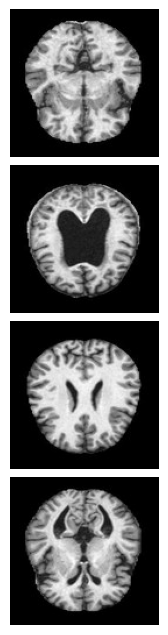

In [ ]:
def plot_images(images, num_images=4, space=0.05, cmap='gray', vmax=None):
    plt.figure(figsize=(2, 8))
    for i in range(4):
        plt.subplot(4, 1, i + 1)
        plt.imshow(images[i].numpy().squeeze(), cmap=cmap, vmax=vmax)
        plt.axis('off')
    plt.subplots_adjust(wspace=space, hspace=space)
    plt.show()

# Fixing the random seed for DataLoader
torch.manual_seed(42)
np.random.seed(42)

# Get a batch of images from the test set
test_iter = iter(test_loader)
images_batch, labels_batch = next(test_iter)

# Select the first 4 images to display
start_index = 20
images = images_batch[start_index:start_index+4]

plot_images(images, 0.05, vmax=1)

# print(len(train_loader))

#### Noisy images

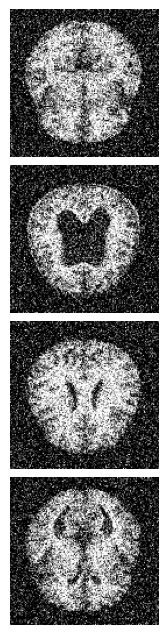

In [ ]:
# torch_images = torch.stack(images)

noisy_images = add_gaussian_noise(images, noise_factor)
plot_images(noisy_images, space=0.05)

#### Linear DAE

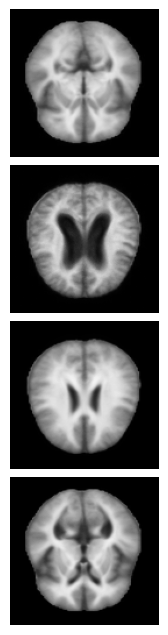

In [ ]:
noisy_images_flattened = noisy_images.view(noisy_images.size(0), -1).to(device)
loaded_models_mri['linear_dae_mri'].to(device).eval()
with torch.no_grad():
    _, predictions_mean, predictions_var = loaded_models_mri['linear_dae_mri'].sample_predict(noisy_images_flattened, 50)

plot_images(predictions_mean.view(-1,image_size,image_size).cpu(), space=0.05, vmax=1)

#### Linear BDAE

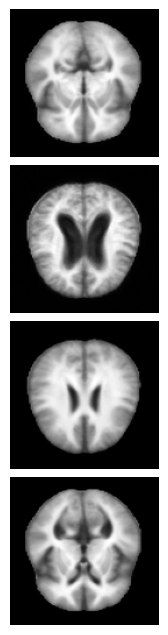

In [ ]:
noisy_images_flattened = noisy_images.view(noisy_images.size(0), -1).to(device)
loaded_models_mri['linear_bdae_mri'].eval()
with torch.no_grad():
    _, predictions_mean, predictions_var = loaded_models_mri['linear_bdae_mri'].to(device).sample_predict(noisy_images_flattened, 10)

plot_images(predictions_mean.view(-1,image_size,image_size).cpu(), space=0.05)

#### Model uncertainty Linear BDAE

0.0101463245


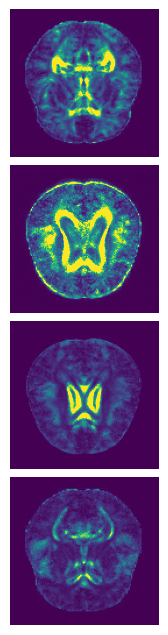

In [ ]:
max_pixel = np.max(predictions_var.cpu().numpy()[:4])
print(max_pixel)

plot_images(predictions_var.view(-1,image_size,image_size).cpu(), space=0.05, cmap='viridis', vmax=0.0025)

#### Convolutional DAE

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


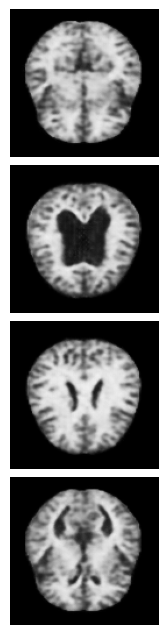

In [ ]:
# noisy_images_flattened = noisy_images.view(noisy_images.size(0), -1).to(device)
loaded_models_mri['convolutional_dae_mri'].to(device).eval()
with torch.no_grad():
    _, predictions_mean, predictions_var = loaded_models_mri['convolutional_dae_mri'].sample_predict(noisy_images.to(device), 50)

plot_images(predictions_mean.view(-1,image_size,image_size).cpu(), space=0.05, vmax=1)

#### Convolutional BDAE

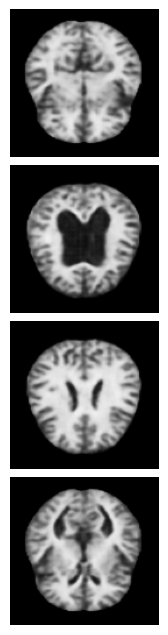

In [ ]:
# noisy_images_flattened = noisy_images.view(noisy_images.size(0), -1).to(device)
loaded_models_mri['convolutional_bdae_mri'].to(device).eval()
with torch.no_grad():
    _, predictions_mean, predictions_var = loaded_models_mri['convolutional_bdae_mri'].sample_predict(noisy_images.to(device), 50)

plot_images(predictions_mean.view(-1,image_size,image_size).cpu(), space=0.05, vmax=1)

#### Model uncertainty Convolutional BDAA

In [ ]:
max_pixel = np.max(predictions_var.cpu().numpy()[:4])
print(max_pixel)

plot_images(predictions_var.view(-1,image_size,image_size).cpu(), space=0.05, cmap='viridis', vmax=0.0025)